# Latent Space Exploration Notebook

This notebook explores the latent space of our autoencoder using latent files from `/data/ggonsior/atd12k/test/`. Each subdirectory contains three files: `latent1.npy`, `latent2.npy`, and `latent3.npy`, each with shape (4, 32, 32) and data type float32.

We will explore various visualization and analysis techniques, including:
1. Dimensionality Reduction
2. Trajectory Visualization  
3. Distance Metrics Analysis  
4. Channel-wise Statistical Maps  
5. Correlation Matrices  
6. Cluster Analysis with K-Means  
7. Manifold Learning (Isomap and LLE)  
8. Temporal Smoothness and Curvature Analysis  
9. Density and Distribution Analysis  
10. Interactive Visualization  
11. Comparing Decoded Outputs Along Different Interpolation Paths  
12. **Deep Learning Interpolation Models:** Comparison of trained deep learning models for predicting latent2 from latent1 and latent3
13. Decoding Deep Learning Interpolations
14. **Alternative (Non-deep–learning) Interpolation Strategies:** SLERP, Cosine, Cubic Hermite, and RBF interpolation
15. Visualizing Decoded Algorithmic Interpolations

In [29]:
import os
import numpy as np
import collections
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns

# Dimensionality reduction and clustering tools
import umap.umap_ as umap_lib
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, Isomap, LocallyLinearEmbedding as LLE
from sklearn.cluster import KMeans

# For interactive visualization
import plotly.express as px

import pandas as pd

from diffusers import AutoencoderKL
from scipy.interpolate import Rbf

import torch
import torch.nn as nn

from models.neural_network import NNModel
from models.transformer import TransformerInterp
from models.unet import UNetInterp
from models.linear_model import LinearModel



# Helper function to load latent files from a given subdirectory
def load_latents(subdir):
    latents = {}
    for i in range(1, 4):
        path = os.path.join(subdir, f"latent{i}.npy")
        if os.path.exists(path):
            latents[f"latent{i}"] = np.load(path)
    return latents

# Helper function to flatten a latent (for dimensionality reduction)
def flatten_latent(latent):
    return latent.flatten()

# Linear interpolation helper
def linear_interpolation(latent_a, latent_b, t):
    return (1 - t) * latent_a + t * latent_b

# Normalize decoded images to [0,1] for display
def normalize_img(tensor):
    tensor = (tensor - tensor.min()) / (tensor.max() - tensor.min() + 1e-8)
    return tensor


# Define a range of t values for interpolation
num_steps = 10
t_values = np.linspace(0, 1, num_steps, endpoint=True)

# Load the trained VAE and checkpoint

device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
vae = AutoencoderKL.from_pretrained("bullhug/kl-f8-anime2")
vae.to(device)
vae.eval()


sample_subdir_disney = "/code/ggonsior/487/latent-interp/tests/Disney_10_00280_s2"
sample_subdir_japan = "/code/ggonsior/487/latent-interp/tests/Japan_1_128981_s2"

latents_disney = load_latents(sample_subdir_disney)
latents_japan = load_latents(sample_subdir_japan)
latents_both = [latents_disney, latents_japan]
sample_both = [sample_subdir_disney, sample_subdir_japan]

An error occurred while trying to fetch bullhug/kl-f8-anime2: bullhug/kl-f8-anime2 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


## 1. Dimensionality Reduction

We load all latent vectors (from latent1, latent2, and latent3 across subdirectories), flatten them, and then project them into 2D using PCA and UMAP.

Found 1458 subdirectories in test.


Loading latents for DR: 100%|██████████| 1458/1458 [00:00<00:00, 2541.02it/s]


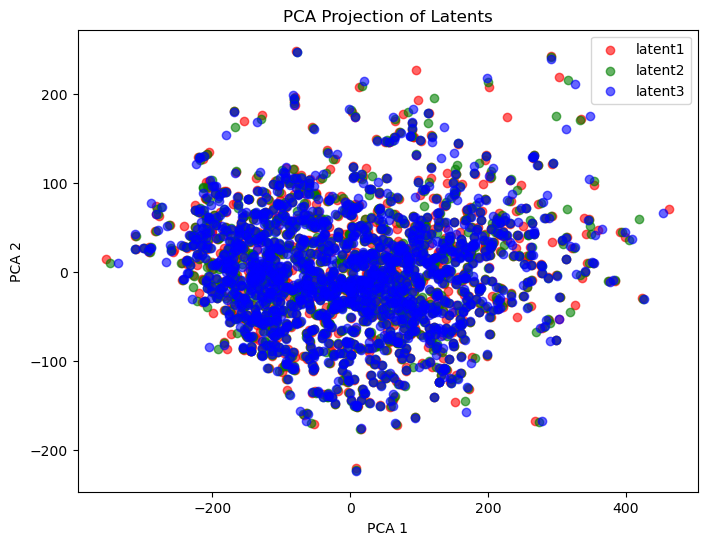

/code/ggonsior/miniforge3/envs/latent-interp/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



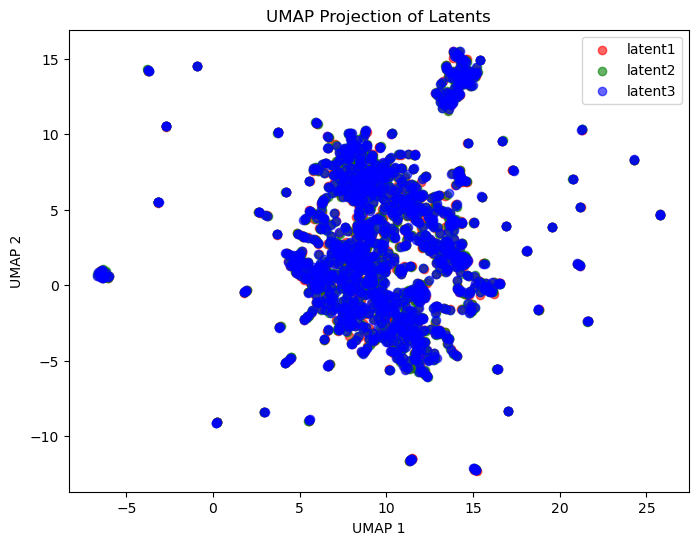

In [30]:
# Gather flattened latents and labels from all subdirectories in test/
base_dir = "/data/ggonsior/atd12k/test/"
subdirs = [os.path.join(base_dir, d) for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
print(f"Found {len(subdirs)} subdirectories in test.")

flat_latents = []
labels = []  # "latent1", "latent2", "latent3" labels
for subdir in tqdm(subdirs, desc="Loading latents for DR"):
    latents = load_latents(subdir)
    if len(latents) < 3:
        continue
    for key in ["latent1", "latent2", "latent3"]:
        flat_latents.append(flatten_latent(latents[key]))
        labels.append(key)
flat_latents = np.vstack(flat_latents)

# PCA Projection
pca = PCA(n_components=2)
embedding_pca = pca.fit_transform(flat_latents)

plt.figure(figsize=(8,6))
for key, color in zip(["latent1", "latent2", "latent3"], ["red", "green", "blue"]):
    idx = [i for i, lab in enumerate(labels) if lab == key]
    plt.scatter(embedding_pca[idx, 0], embedding_pca[idx, 1], label=key, alpha=0.6, c=color)
plt.legend()
plt.title("PCA Projection of Latents")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.show()

# UMAP Projection
umap_reducer = umap_lib.UMAP(n_neighbors=10, min_dist=0.3, metric='euclidean')
embedding_umap = umap_reducer.fit_transform(flat_latents)

plt.figure(figsize=(8,6))
for key, color in zip(["latent1", "latent2", "latent3"], ["red", "green", "blue"]):
    idx = [i for i, lab in enumerate(labels) if lab == key]
    plt.scatter(embedding_umap[idx, 0], embedding_umap[idx, 1], label=key, alpha=0.6, c=color)
plt.legend()
plt.title("UMAP Projection of Latents")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.show()


The UMAP looks as if it has learned some features of the latent space. This is evident by the clusters on the left and top. With more time, I would explore specific points in those clusters. PCA doesn't look like it learned any features

## 2. Trajectory Visualization

For each subdirectory, we plot the trajectory connecting latent1, latent2, and latent3. We also overlay the straight-line interpolation between latent1 and latent3.

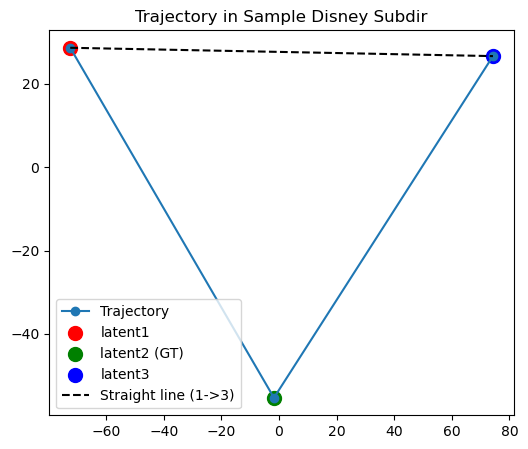

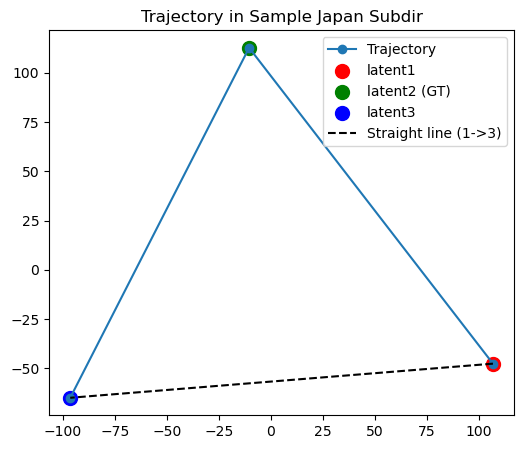

In [31]:
def plot_trajectory(latents, title="Latent Trajectory"):
    # Use PCA to reduce the 3 high-dimensional points to 2D for simple visualization.
    data = np.vstack([flatten_latent(latents["latent1"]),
                      flatten_latent(latents["latent2"]),
                      flatten_latent(latents["latent3"])])
    pca_temp = PCA(n_components=2)
    proj = pca_temp.fit_transform(data)
    plt.figure(figsize=(6,5))
    plt.plot(proj[:, 0], proj[:, 1], 'o-', label="Trajectory")
    plt.scatter(proj[0, 0], proj[0, 1], color='red', s=100, label="latent1")
    plt.scatter(proj[1, 0], proj[1, 1], color='green', s=100, label="latent2 (GT)")
    plt.scatter(proj[2, 0], proj[2, 1], color='blue', s=100, label="latent3")
    # Plot straight-line from latent1 to latent3
    plt.plot([proj[0, 0], proj[2, 0]], [proj[0, 1], proj[2, 1]], 'k--', label="Straight line (1->3)")
    plt.title(title)
    plt.legend()
    plt.show()

# Choose one sample subdirectory for each category (e.g., one Disney and one Japan)
sample_disney = [d for d in subdirs if "Disney" in d]
sample_japan  = [d for d in subdirs if "Japan" in d]

if sample_disney:
    latents_disney = load_latents(sample_disney[0])
    plot_trajectory(latents_disney, title="Trajectory in Sample Disney Subdir")
if sample_japan:
    latents_japan = load_latents(sample_japan[0])
    plot_trajectory(latents_japan, title="Trajectory in Sample Japan Subdir")

This is a cool analysis because it shows that a simple linear interpolation between latent 1 and latent 3 will not yield latent 2. This suggests that some type of learning will probably be needed in order to accurately predict the interpolation frame

## 3. Distance Metrics Analysis

We compute the Euclidean distances between latent1, latent2, and latent3 for each subdirectory and plot the distribution of these distances.

Computing Distance Metrics: 100%|██████████| 1458/1458 [00:00<00:00, 2369.03it/s]


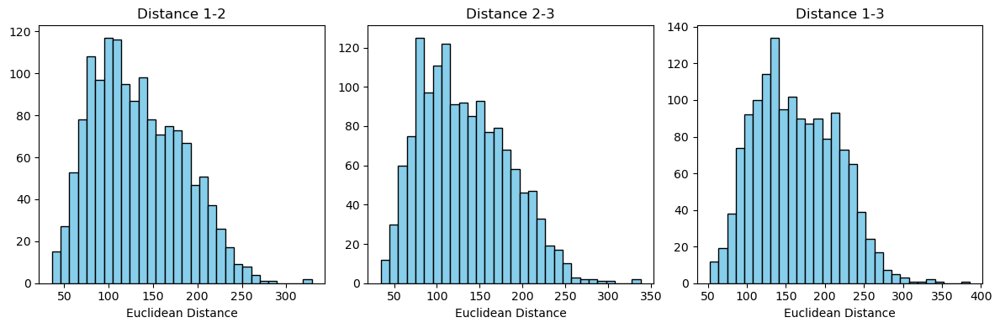

In [32]:
distances = {"1-2": [], "2-3": [], "1-3": []}
for subdir in tqdm(subdirs, desc="Computing Distance Metrics"):
    latents = load_latents(subdir)
    if len(latents) < 3:
        continue
    l1 = flatten_latent(latents["latent1"])
    l2 = flatten_latent(latents["latent2"])
    l3 = flatten_latent(latents["latent3"])
    distances["1-2"].append(np.linalg.norm(l1 - l2))
    distances["2-3"].append(np.linalg.norm(l2 - l3))
    distances["1-3"].append(np.linalg.norm(l1 - l3))

plt.figure(figsize=(12,4))
for i, key in enumerate(distances):
    plt.subplot(1, 3, i+1)
    plt.hist(distances[key], bins=30, color='skyblue', edgecolor='k')
    plt.title(f"Distance {key}")
    plt.xlabel("Euclidean Distance")
plt.tight_layout()
plt.show()


This visualization is somewhat interesting. It's showing how far each latent is from the other two latents. As we can see from the plots above, there isn't too much of a difference between the distances from any latent to another. In an ideal world, distance between 1-3 should be larger than the others, and 1-2 and 2-3 should be very similar. This would suggest that latent 2 is usually somewhere between latent 1 and latent 3. 

## 4. Channel-wise Statistical Maps

We compute per-channel means and standard deviations for each latent (latent1, latent2, latent3) across subdirectories and visualize one example as a heatmap.

Channel-wise Stats: 100%|██████████| 1458/1458 [00:00<00:00, 1708.09it/s]


latent1: Channel means = [ 0.38375345 -5.030993    1.856629    1.8831795 ], Channel std = [3.839463  4.330062  3.7210915 2.9854767]
latent2: Channel means = [ 0.3866956 -5.0244813  1.850446   1.8791181], Channel std = [3.8405719 4.330355  3.7214067 2.9865746]
latent3: Channel means = [ 0.39155865 -5.0187263   1.8466122   1.874402  ], Channel std = [3.8397188 4.3289757 3.7232792 2.985272 ]


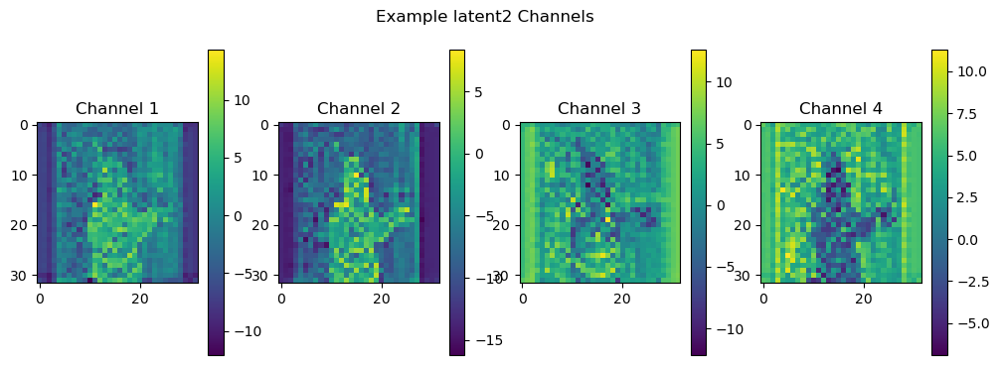

In [33]:
stats = collections.defaultdict(lambda: {"mean": [], "std": []})
for subdir in tqdm(subdirs, desc="Channel-wise Stats"):
    latents = load_latents(subdir)
    if len(latents) < 3:
        continue
    for key in ["latent1", "latent2", "latent3"]:
        latent = latents[key]  # shape: (4, 32, 32)
        mean_per_channel = latent.reshape(latent.shape[0], -1).mean(axis=1)
        std_per_channel = latent.reshape(latent.shape[0], -1).std(axis=1)
        stats[key]["mean"].append(mean_per_channel)
        stats[key]["std"].append(std_per_channel)

for key in ["latent1", "latent2", "latent3"]:
    mean_avg = np.mean(np.vstack(stats[key]["mean"]), axis=0)
    std_avg = np.mean(np.vstack(stats[key]["std"]), axis=0)
    print(f"{key}: Channel means = {mean_avg}, Channel std = {std_avg}")

# Visualize channels of an example latent2
example_latent = load_latents(subdirs[0])["latent2"]
plt.figure(figsize=(12,4))
for ch in range(example_latent.shape[0]):
    plt.subplot(1, example_latent.shape[0], ch+1)
    plt.imshow(example_latent[ch], cmap='viridis')
    plt.title(f"Channel {ch+1}")
    plt.colorbar()
plt.suptitle("Example latent2 Channels")
plt.show()

This one just shows the mean and standard deviations for each channel. Not that cool (or useful), but I wanted to visualize the latents in latent space using images (I can see how that would be confusing because we're talking about image representations of latent representations of images.)

## 5. Correlation Matrices

For a given subdirectory, compute and plot the correlation matrix between channels of each latent.

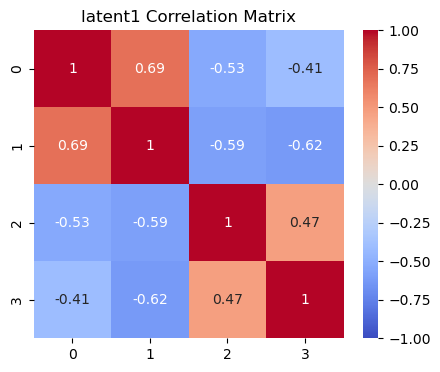

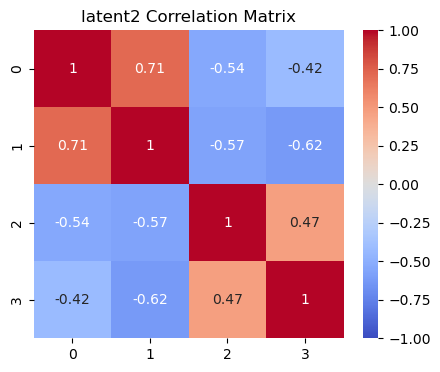

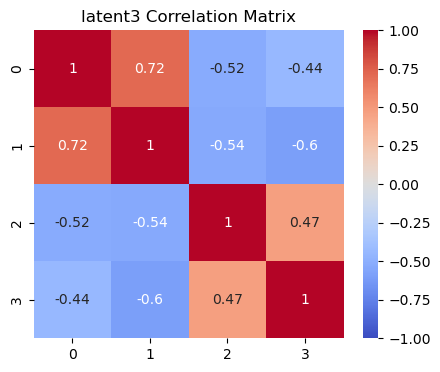

In [34]:
def plot_correlation(latent, title="Correlation Matrix"):
    data = latent.reshape(latent.shape[0], -1)
    corr = np.corrcoef(data)
    plt.figure(figsize=(5,4))
    sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(title)
    plt.show()

sample_latents = load_latents(subdirs[0])
for key in ["latent1", "latent2", "latent3"]:
    plot_correlation(sample_latents[key], title=f"{key} Correlation Matrix")

The confusion matrices above show that the 4 channels of the latent space are sufficiently different. If any 2 channels were very similar, this would imply that the latent space could be reduced from 4 to 3 channels without much information loss. This is showing that all 4 channels of the latent space are contributing to the decoding process of the VAE.

## 6. Cluster Analysis with K-Means

We use K-Means clustering on the flattened latent2 representations across subdirectories and visualize the clusters using PCA.

Gathering latents for Clustering: 100%|██████████| 1458/1458 [00:01<00:00, 1249.51it/s]


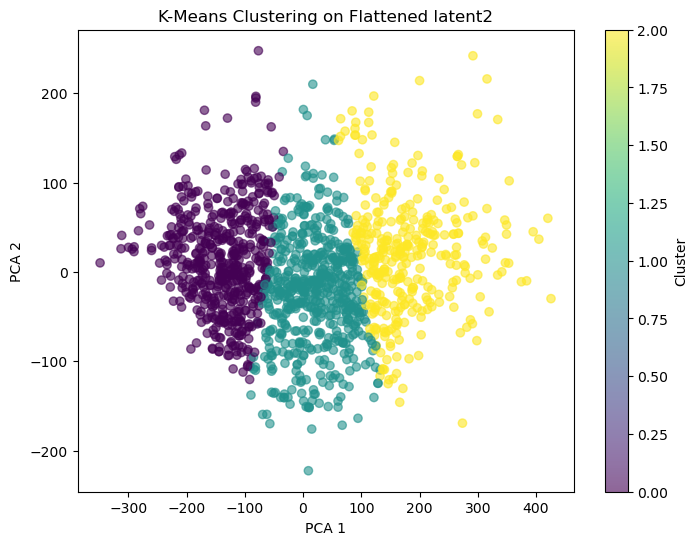

In [35]:
all_flat = []
for subdir in tqdm(subdirs, desc="Gathering latents for Clustering"):
    latents = load_latents(subdir)
    if len(latents) < 3:
        continue
    all_flat.append(flatten_latent(latents["latent2"]))
all_flat = np.vstack(all_flat)

pca = PCA(n_components=2)
proj = pca.fit_transform(all_flat)

kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(all_flat)

plt.figure(figsize=(8,6))
plt.scatter(proj[:, 0], proj[:, 1], c=clusters, cmap='viridis', alpha=0.6)
plt.title("K-Means Clustering on Flattened latent2")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.colorbar(label="Cluster")
plt.show()

Not super interesting. Not really sure what I hoping for. 

## 7. Manifold Learning (Isomap and LLE)

We use alternative manifold learning techniques (Isomap and LLE) to project the latent2 representations to 2D.

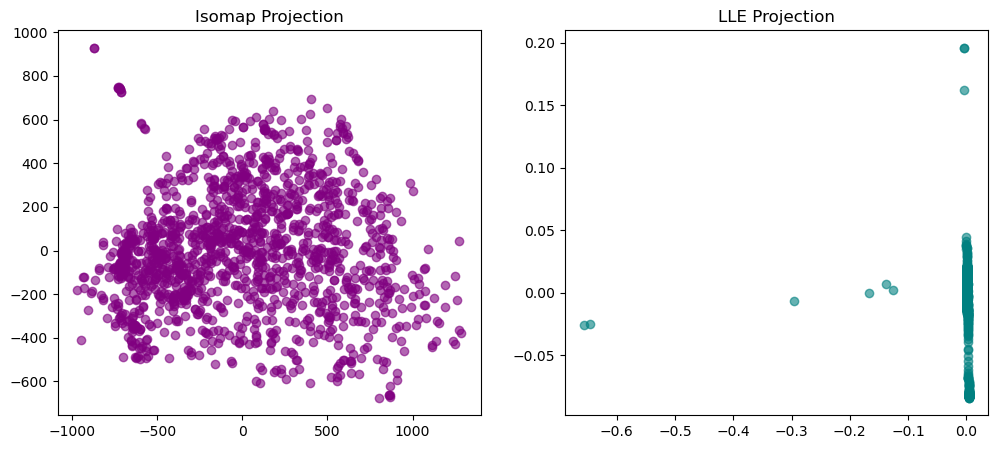

In [36]:
isomap = Isomap(n_components=2, n_neighbors=10)
embedding_isomap = isomap.fit_transform(all_flat)

lle = LLE(n_components=2, n_neighbors=10)
embedding_lle = lle.fit_transform(all_flat)

fig, axes = plt.subplots(1, 2, figsize=(12,5))
axes[0].scatter(embedding_isomap[:, 0], embedding_isomap[:, 1], c='purple', alpha=0.6)
axes[0].set_title("Isomap Projection")
axes[1].scatter(embedding_lle[:, 0], embedding_lle[:, 1], c='teal', alpha=0.6)
axes[1].set_title("LLE Projection")
plt.show()

I was hoping to see a very interesting clustering if we allow the clustering to project the latent space onto a different space. This was not the case. Isomap didn't change the visualization much, and LLE just mapped everything onto a line. 

## 8. Temporal Smoothness and Curvature Analysis

For each subdirectory, compute the curvature of the latent trajectory by comparing the actual path (latent1 → latent2 → latent3) with the straight-line distance from latent1 to latent3.

Computing Curvature: 100%|██████████| 1458/1458 [00:00<00:00, 2402.87it/s]


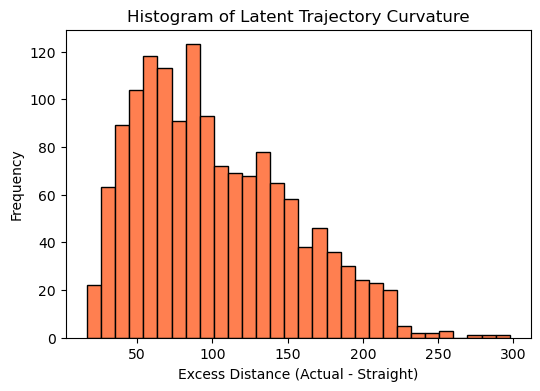

Average curvature: 102.293335


In [37]:
curvatures = []
for subdir in tqdm(subdirs, desc="Computing Curvature"):
    latents = load_latents(subdir)
    if len(latents) < 3:
        continue
    l1 = flatten_latent(latents["latent1"])
    l2 = flatten_latent(latents["latent2"])
    l3 = flatten_latent(latents["latent3"])
    d_actual = np.linalg.norm(l1 - l2) + np.linalg.norm(l2 - l3)
    d_straight = np.linalg.norm(l1 - l3)
    curvature = d_actual - d_straight
    curvatures.append(curvature)
    
plt.figure(figsize=(6,4))
plt.hist(curvatures, bins=30, color='coral', edgecolor='k')
plt.title("Histogram of Latent Trajectory Curvature")
plt.xlabel("Excess Distance (Actual - Straight)")
plt.ylabel("Frequency")
plt.show()

print("Average curvature:", np.mean(curvatures))

The histogram shows a very similar result to the distance histograms. The tragectory curve is showing how far latent 2 is from the straight line between latent 1 and latent 3. I was hoping to gain a little more insight into the latent space from this, but sadly, I did not.

## 9. Density and Distribution Analysis

Plot histograms and kernel density estimates for each channel of latent2 across all subdirectories.

Aggregating Channel Data: 100%|██████████| 1458/1458 [00:00<00:00, 2569.73it/s]


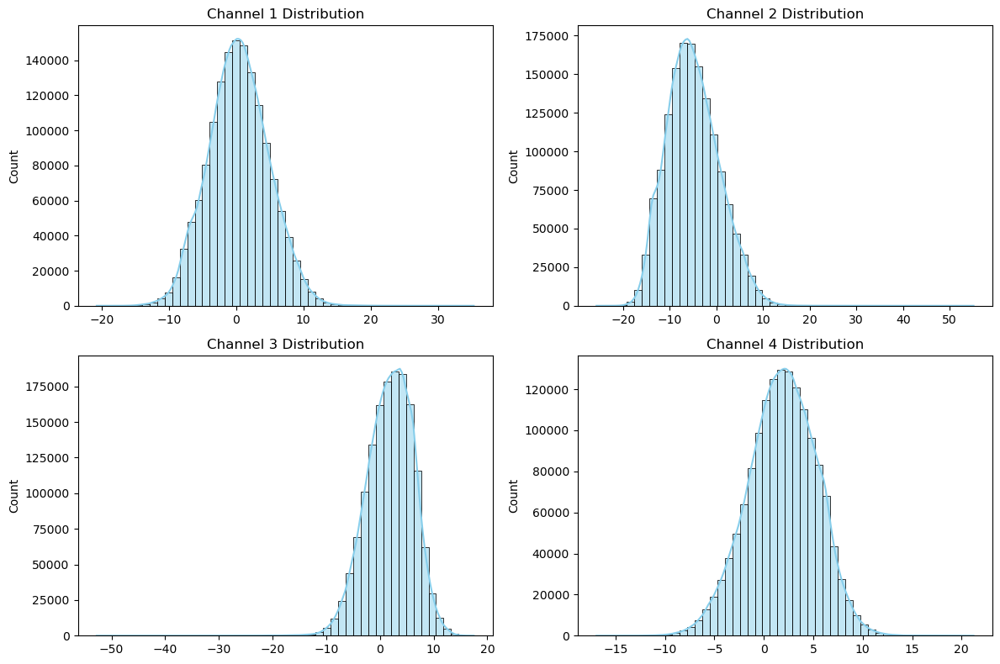

In [38]:
channel_data = {i: [] for i in range(4)}
for subdir in tqdm(subdirs, desc="Aggregating Channel Data"):
    latents = load_latents(subdir)
    if "latent2" not in latents:
        continue
    latent2 = latents["latent2"]
    for ch in range(4):
        channel_data[ch].append(latent2[ch].flatten())
for ch in range(4):
    channel_data[ch] = np.concatenate(channel_data[ch])

plt.figure(figsize=(12,8))
for ch in range(4):
    plt.subplot(2,2,ch+1)
    sns.histplot(channel_data[ch], bins=50, kde=True, color='skyblue')
    plt.title(f"Channel {ch+1} Distribution")
plt.tight_layout()
plt.show()

This is another coool way of visualizing that the channels are infact contributing different information to the decoder. If this weren't the case, all the distributions would look the exact same. 

## 10. Interactive Visualization with Plotly

Create an interactive scatter plot of the PCA projection of latent2 vectors, with hover information.

In [39]:
pca = PCA(n_components=2)
proj_interactive = pca.fit_transform(all_flat)
df = pd.DataFrame(proj_interactive, columns=["PCA1", "PCA2"])
df["Index"] = range(len(df))

fig = px.scatter(df, x="PCA1", y="PCA2", hover_data=["Index"],
                 title="Interactive PCA Projection of latent2")
fig.show()

I had big plans for this interactive map. I was hoping to make it show the corresponding frame2.jpg when you hover over it. I could not get this working unfortunately.

## 11. Comparing Decoded Outputs: Actual Trajectory vs. Straight-Line Interpolation

Using a trained VAE decoder, we decode latent vectors sampled along:
- The actual trajectory (latent1 → latent2 → latent3)
- The straight-line interpolation from latent1 to latent3
and compare the decoded images.

Loaded latent shapes:
latent1 (4, 32, 32)
latent2 (4, 32, 32)
latent3 (4, 32, 32)


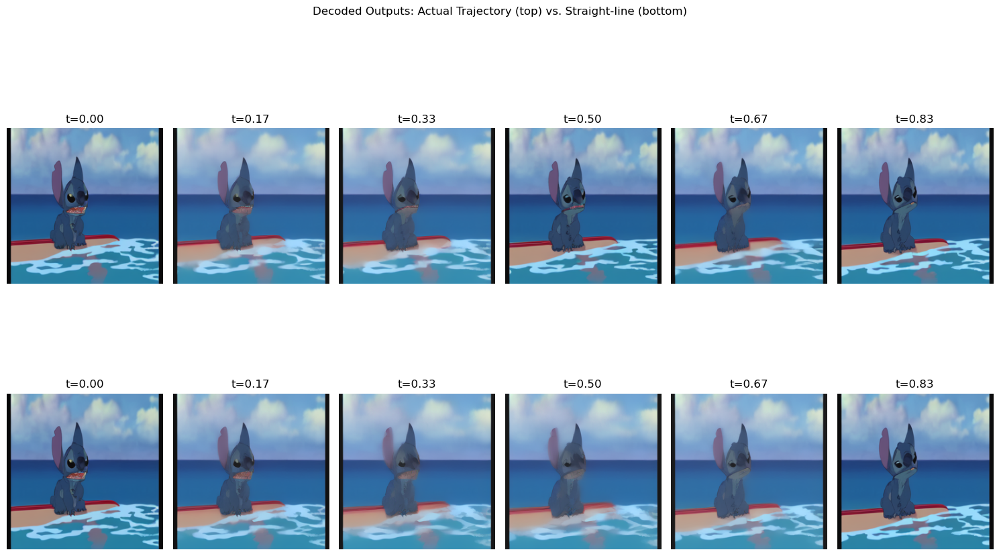

Loaded latent shapes:
latent1 (4, 32, 32)
latent2 (4, 32, 32)
latent3 (4, 32, 32)


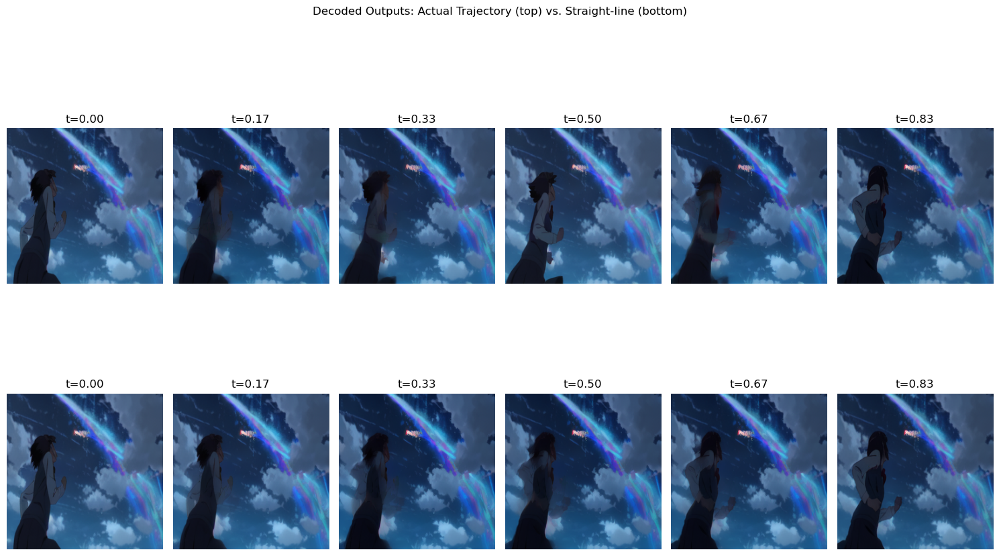

In [40]:
for sample_subdir in sample_both:
    latents = load_latents(sample_subdir)
    print("Loaded latent shapes:")
    for k, v in latents.items():
        print(k, v.shape)

    # Convert loaded latents to torch tensors (assuming float32)  
    latent1 = torch.tensor(latents["latent1"], dtype=torch.float32)
    latent2 = torch.tensor(latents["latent2"], dtype=torch.float32)
    latent3 = torch.tensor(latents["latent3"], dtype=torch.float32)

    # Define interpolation parameters
    num_steps_seg = 3  # steps per segment

    # Actual trajectory: latent1 -> latent2, then latent2 -> latent3
    actual_interpolations = []
    # Interpolate from latent1 to latent2
    for t in np.linspace(0, 1, num_steps_seg, endpoint=False):
        interp = linear_interpolation(latent1, latent2, t)
        actual_interpolations.append(interp)
    # Interpolate from latent2 to latent3
    for t in np.linspace(0, 1, num_steps_seg, endpoint=True):
        interp = linear_interpolation(latent2, latent3, t)
        actual_interpolations.append(interp)

    # Straight-line interpolation: latent1 -> latent3
    num_steps_total = 2 * num_steps_seg  # match total number of steps
    straight_interpolations = []
    for t in np.linspace(0, 1, num_steps_total, endpoint=True):
        interp = linear_interpolation(latent1, latent3, t)
        straight_interpolations.append(interp)



    with torch.no_grad():
        decoded_actual = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in actual_interpolations]
        decoded_straight = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in straight_interpolations]

    # Plot the results: one row for actual trajectory and one row for straight-line interpolation.
    num_samples = len(decoded_actual)
    plt.figure(figsize=(15, 10))
    for i in range(num_samples):
        # Actual trajectory row (top)
        plt.subplot(2, num_samples, i+1)
        img = decoded_actual[i].permute(1,2,0).numpy()
        plt.imshow(img)
        plt.title(f"t={i/num_samples:.2f}")
        plt.axis("off")
        # Straight-line row (bottom)
        plt.subplot(2, num_samples, num_samples + i+1)
        img2 = decoded_straight[i].permute(1,2,0).numpy()
        plt.imshow(img2)
        plt.title(f"t={i/num_samples:.2f}")
        plt.axis("off")
    plt.suptitle("Decoded Outputs: Actual Trajectory (top) vs. Straight-line (bottom)")
    plt.tight_layout()
    plt.show()

This one's really cool. It shows interpolations between 1-2-3 on the top, and then interpolations between 1-3 on the bottom. My hope was to see intermediate frames, but I knew the results weren't going to be perfect. Linear interpolation on the shortest path between 2 latents is not powerful enough to capture the intricacies of animation. If this were the case, we wouldn't need to create methods like flow matching. 

In these images, you can clearly see that linearly interpolating in the latent space learned by the VAE will blur the in between images until they reach the next latent. I didn't have high hopes for this method, but I did want to visualize it.

## 12. Deep Learning Interpolation Models Comparison

In this cell, we compare the predictions of several deep learning interpolation models (trained to predict latent2 from latent1 and latent3). We load a set of pre-trained models (e.g., NNModel, TransformerInterp, UNetInterp, DiffusionModel, FlowMatchingModel, TransformerDiffusion, LinearModel) from our checkpoints, apply them to a sample latent pair (latent1 and latent3), and visualize their predicted latent2 in a PCA projection.

/code/ggonsior/miniforge3/envs/latent-interp/lib/python3.13/site-packages/torch/nn/modules/transformer.py:385: UserWarning:

enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)



Loaded latent files and their shapes:
latent1 (4, 32, 32) float32
latent2 (4, 32, 32) float32
latent3 (4, 32, 32) float32


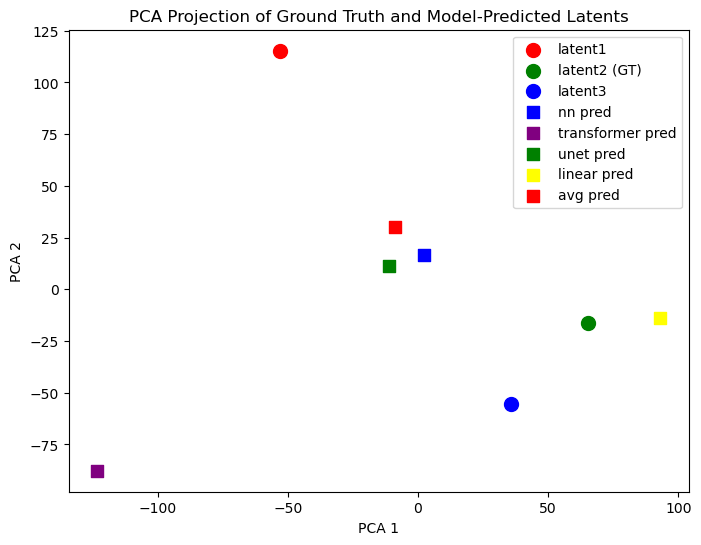

In [50]:
# For demonstration, a dummy model that simply averages latent1 and latent3.
class AVGModel(nn.Module):
    def forward(self, latent1, latent3):
        return 0.5 * latent1 + 0.5 * latent3

chckpt_dir = "//code/ggonsior/487/latent-interp/checkpoints/"
trained_models = {
    "nn": NNModel(latent_dim=4).to(device),
    "transformer": TransformerInterp(latent_dim=4).to(device),
    "unet": UNetInterp(latent_dim=4).to(device),
    "linear": LinearModel(latent_dim=4).to(device),
    "avg": AVGModel()
}


trained_models["nn"].load_state_dict(torch.load(f"{chckpt_dir}nn_epoch{540-60}.pth", map_location=device)["model_state"])
trained_models["transformer"].load_state_dict(torch.load(f"{chckpt_dir}transformer_epoch{97-60}.pth", map_location=device)["model_state"])
trained_models["unet"].load_state_dict(torch.load(f"{chckpt_dir}unet_epoch{456-60}.pth", map_location=device)["model_state"])
trained_models["linear"].load_state_dict(torch.load(f"{chckpt_dir}linear_epoch{72-60}.pth", map_location=device)["model_state"])


# Choose one sample for visualization (here, we'll do the Disney sample)
latents = load_latents(sample_subdir_disney)
print("Loaded latent files and their shapes:")
for k, v in latents.items():
    print(k, v.shape, v.dtype)

# Convert latents to torch tensors for model inference.
latent1 = torch.tensor(latents["latent1"], dtype=torch.float32).to(device)
latent2_gt = torch.tensor(latents["latent2"], dtype=torch.float32).to(device)
latent3 = torch.tensor(latents["latent3"], dtype=torch.float32).to(device)



flat_latent1 = flatten_latent(latents["latent1"])
flat_latent2_gt = flatten_latent(latents["latent2"])
flat_latent3 = flatten_latent(latents["latent3"])

# Get model predictions.
model_predictions = {}
for name, model in trained_models.items():
    model.eval()
    with torch.no_grad():
        # Assume model's forward takes (latent1, latent3) and outputs a prediction for latent2.
        pred = model(latent1.unsqueeze(0), latent3.unsqueeze(0))
    # Remove batch dimension and convert to numpy.
    model_predictions[name] = pred.squeeze(0).cpu().numpy()


# Flatten predictions.
flat_model_preds = {name: flatten_latent(pred) for name, pred in model_predictions.items()}

# Build a list of all latent vectors to project:
# We'll include: latent1, ground truth latent2, latent3, then each model prediction.
all_vectors = [flat_latent1, flat_latent2_gt, flat_latent3]
labels = ["latent1", "latent2 (GT)", "latent3"]
colors = ["red", "green", "blue"]
name_colors = {"nn": "blue", "transformer": "purple", "unet": "green", "linear": "yellow", "avg":"red"}

for name, vec in flat_model_preds.items():
    all_vectors.append(vec)
    labels.append(f"{name} pred")
    colors.append(name_colors[name])

all_vectors = np.vstack(all_vectors)

# Use PCA to project to 2D.
pca = PCA(n_components=2)
embedding = pca.fit_transform(all_vectors)

# Plot the embeddings.
plt.figure(figsize=(8,6))
for i, label in enumerate(labels):
    marker = "o" if "GT" in label or "latent" in label else "s"
    s = 100 if marker=="o" else 80
    plt.scatter(embedding[i, 0], embedding[i, 1], color=colors[i], label=label, marker=marker, s=s)
plt.legend()
plt.title("PCA Projection of Ground Truth and Model-Predicted Latents")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.show()


I trained a couple, low-powered deep learning models, and the results weren't super promising. This wasn't my main goal of this project, and it took long enough to get all the code for a modular training system setup, so I decided to move on to the latent space analysis. I'm happy because if I ever revist this project, I now have a very structured pipeline for training and evaluating models. I am very pleased with this aspect of the project.

As you can clearly see in the plot above, none of the models were that great. In terms of this 2D simplification of the latent space, it's clear that most of the models learned how to get somewhere between latent 1 and latent 3, but none of them were that close to a correct prediction. I was surprised to see the linear model was the closest, because its loss was by far the worst during training. I will show the loss curves below. They are also located in ```results/```.

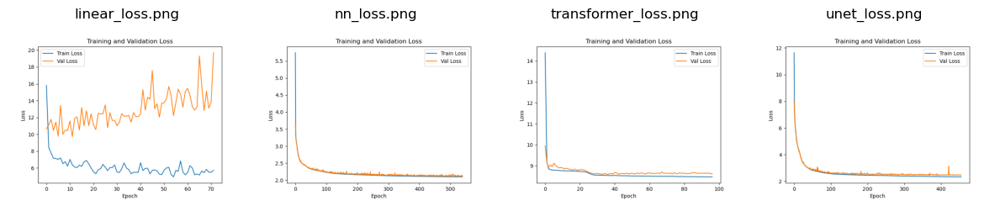

In [52]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images_in_directory(directory, max_images=20):
    """
    Display all images in the given directory using matplotlib.
    
    Args:
        directory (str): Path to the directory containing images.
        max_images (int): Maximum number of images to display (default: 20).
    """
    # Get a list of all image files in the directory
    image_files = [f for f in os.listdir(directory) if f.lower().endswith(('png', 'jpg', 'jpeg'))]
    
    if not image_files:
        print("No image files found in the directory.")
        return
    
    num_images = min(len(image_files), max_images)
    cols = min(5, num_images)  # Display up to 5 images per row
    rows = (num_images + cols - 1) // cols

    plt.figure(figsize=(cols * 3, rows * 3))
    
    for i, img_file in enumerate(image_files[:num_images]):
        img_path = os.path.join(directory, img_file)
        image = Image.open(img_path)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(image)
        plt.title(img_file)
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# Example Usage
directory_path = "./results/"
display_images_in_directory(directory_path)


It's very evident that I need to spend more time/power training these models. Their architectures were super simplistice and weak to begin with. This will be the focus of my work next time I work on this project.

## 13. Deep Learning Latents Decoded

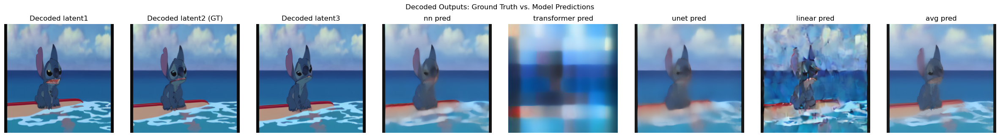

In [51]:
# Decode ground truth latent2, latent1 and latent3 for reference.
with torch.no_grad():
    # Ensure they have a batch dimension.
    dec_latent1 = vae.decode(latent1.unsqueeze(0).to(device)).sample.cpu().squeeze(0)
    dec_latent2_gt = vae.decode(latent2_gt.unsqueeze(0).to(device)).sample.cpu().squeeze(0)
    dec_latent3 = vae.decode(latent3.unsqueeze(0).to(device)).sample.cpu().squeeze(0)

# Decode predictions from each model.
decoded_predictions = {}
for name, pred_np in model_predictions.items():
    pred_tensor = torch.tensor(pred_np, dtype=torch.float32).unsqueeze(0).to(device)
    with torch.no_grad():
        # Assume vae.decode returns an object with .sample containing the decoded image.
        decoded_img = vae.decode(pred_tensor).sample.cpu().squeeze(0)
    decoded_predictions[name] = decoded_img

# Plot all decoded images side by side.
# We'll create one row with the ground truth decoded images and one row per model.
num_models = len(decoded_predictions)
plt.figure(figsize=(3*(num_models+3), 6))

# First row: Ground Truth Latents
titles = ["Decoded latent1", "Decoded latent2 (GT)", "Decoded latent3"]
decoded_refs = [dec_latent1, dec_latent2_gt, dec_latent3]
for i, (title, img) in enumerate(zip(titles, decoded_refs)):
    plt.subplot(2, num_models+3, i+1)
    plt.imshow(normalize_img(img).permute(1,2,0).numpy())
    plt.title(title)
    plt.axis("off")

# Second row: Model predictions
for j, (name, img) in enumerate(decoded_predictions.items()):
    plt.subplot(2, num_models+3, 3 + j + 1)
    plt.imshow(normalize_img(img).permute(1,2,0).numpy())
    plt.title(f"{name} pred")
    plt.axis("off")

plt.suptitle("Decoded Outputs: Ground Truth vs. Model Predictions")
plt.tight_layout()
plt.show()

Even though I had terrible results from the deep learning models, I wanted to see what their predictions were. Honestly, they did ok. Definitely not passing, but the only one that totally missed the mark was the transformer. The first time I worked on this project was 2 years ago, in which I trained a GAN to interpolate between frames 1 and 3 in image space. The results of that model were very similar to both the transformer and linear models above. 

## 14. Alternative (Non-Deep-Learning) Interpolation Strategies

Below we explore four different interpolation strategies beyond simple linear interpolation:
- **SLERP (Spherical Linear Interpolation)**
- **Cosine Interpolation**
- **Cubic Hermite Interpolation**
- **RBF Interpolation**

For any machine learning–based strategy (if applicable), you can save and load model weights from the checkpoints folder. In this example, we implement the methods without deep learning.

### SLERP


In [42]:
def slerp(a, b, t):
    # a and b are numpy arrays (flattened or same shape)
    a_norm = np.linalg.norm(a)
    b_norm = np.linalg.norm(b)
    if a_norm == 0 or b_norm == 0:
        return (1-t)*a + t*b  # fallback to linear
    a_unit = a / a_norm
    b_unit = b / b_norm
    dot = np.clip(np.dot(a_unit.flatten(), b_unit.flatten()), -1.0, 1.0)
    omega = np.arccos(dot)
    if np.abs(omega) < 1e-10:
        return (1-t)*a + t*b  # if the angle is very small, use linear
    so = np.sin(omega)
    return (np.sin((1-t)*omega)/so)*a + (np.sin(t*omega)/so)*b

latents = load_latents(sample_both[0])
latent1 = torch.tensor(latents["latent1"], dtype=torch.float32)
latent2 = torch.tensor(latents["latent2"], dtype=torch.float32)
latent3 = torch.tensor(latents["latent3"], dtype=torch.float32)


# For each segment, we apply SLERP:
num_steps = 10
t_values = np.linspace(0, 1, num_steps, endpoint=False)
slerp_interp = []
# SLERP from latent1 to latent2:
for t in t_values:
    slerp_interp.append(slerp(latent1.flatten(), latent2.flatten(), t).reshape(latent1.shape))
# SLERP from latent2 to latent3 (including endpoint):
t_values2 = np.linspace(0, 1, num_steps, endpoint=True)
for t in t_values2:
    slerp_interp.append(slerp(latent2.flatten(), latent3.flatten(), t).reshape(latent1.shape))

print("SLERP interpolation produced", len(slerp_interp), "latent samples.")


SLERP interpolation produced 20 latent samples.


/tmp/ipykernel_2837551/433723038.py:9: DeprecationWarning:

__array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.



### Cosine Interpolation

In [43]:
def cosine_interpolation(a, b, t):
    # t is remapped using a cosine easing function.
    t2 = (1 - np.cos(np.pi * t)) / 2
    return (1-t2)*a + t2*b

num_steps = 10
t_values = np.linspace(0, 1, num_steps, endpoint=False)
cosine_interp = []
# Cosine interpolation from latent1 to latent2:
for t in t_values:
    cosine_interp.append(cosine_interpolation(latent1, latent2, t))
# Cosine interpolation from latent2 to latent3:
t_values2 = np.linspace(0, 1, num_steps, endpoint=True)
for t in t_values2:
    cosine_interp.append(cosine_interpolation(latent2, latent3, t))

print("Cosine interpolation produced", len(cosine_interp), "latent samples.")

Cosine interpolation produced 20 latent samples.


### Cubic Hermite Interpolation

In [44]:
def cubic_hermite(p0, p1, m0, m1, t):
    # Cubic Hermite basis functions
    h00 = 2*t**3 - 3*t**2 + 1
    h10 = t**3 - 2*t**2 + t
    h01 = -2*t**3 + 3*t**2
    h11 = t**3 - t**2
    return h00 * p0 + h10 * m0 + h01 * p1 + h11 * m1

# For piecewise interpolation, we need tangents.
# A simple choice: for the segment from latent1 to latent2:
m0_12 = latent2 - latent1
# For the endpoint at latent2, we can set the tangent as the average of the incoming and outgoing differences.
m1_12 = 0.5 * (latent3 - latent1)
# Similarly, for segment latent2 to latent3:
m0_23 = m1_12  # use the same tangent as latent2's
m1_23 = latent3 - latent2

num_steps = 10
t_values = np.linspace(0, 1, num_steps, endpoint=False)
cubic_interp = []
# Cubic Hermite interpolation from latent1 to latent2:
for t in t_values:
    interp = cubic_hermite(latent1, latent2, m0_12, m1_12, t)
    cubic_interp.append(interp)
# Cubic Hermite interpolation from latent2 to latent3:
t_values2 = np.linspace(0, 1, num_steps, endpoint=True)
for t in t_values2:
    interp = cubic_hermite(latent2, latent3, m0_23, m1_23, t)
    cubic_interp.append(interp)

print("Cubic Hermite interpolation produced", len(cubic_interp), "latent samples.")

Cubic Hermite interpolation produced 20 latent samples.


### RBF Interpolation

In [45]:
from scipy.interpolate import Rbf

def rbf_interpolation(p0, p1, p2, t):
    # We treat the latent as a function of time with three points:
    # t0=0 for p0, t1=0.5 for p1, t2=1 for p2.
    # We'll use an RBF interpolator for each element.
    t_points = np.array([0.0, 0.5, 1.0])
    # Flatten the points:
    p0_flat = p0.flatten()
    p1_flat = p1.flatten()
    p2_flat = p2.flatten()
    # For each element, we create an RBF interpolator.
    # To vectorize, stack all three into a matrix.
    values = np.vstack([p0_flat, p1_flat, p2_flat])  # shape (3, N)
    # We'll create one RBF per element; for efficiency we can use list comprehension.
    interpolated = []
    for i in range(values.shape[1]):
        rbf = Rbf(t_points, values[:, i], function='multiquadric')
        interpolated.append(rbf(t))
    return np.array(interpolated).reshape(p0.shape)

num_steps = 20
t_values = np.linspace(0, 1, num_steps, endpoint=True)
rbf_interp = []
# Here we use all three points at once (latent1, latent2, latent3)
for t in t_values:
    interp = rbf_interpolation(latent1, latent2, latent3, t)
    rbf_interp.append(interp)

print("RBF interpolation produced", len(rbf_interp), "latent samples.")

RBF interpolation produced 20 latent samples.


### Plotting the Alternative Interpolation Strategies

We now project the interpolated latent vectors from each method using PCA and plot them for comparison.

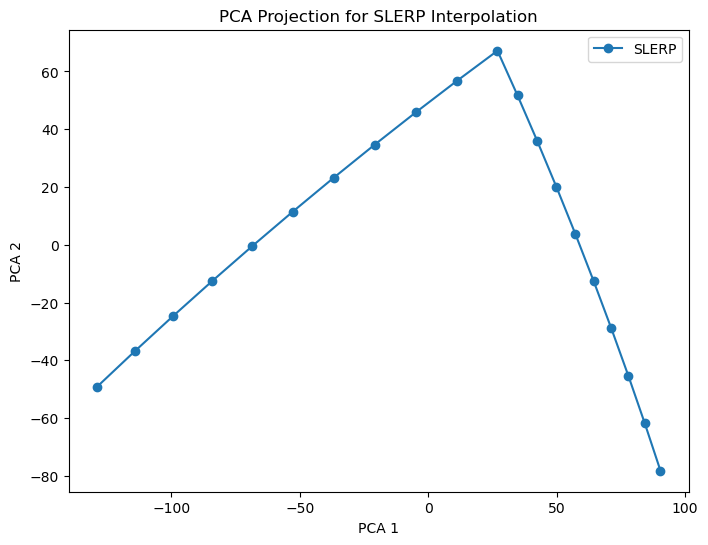

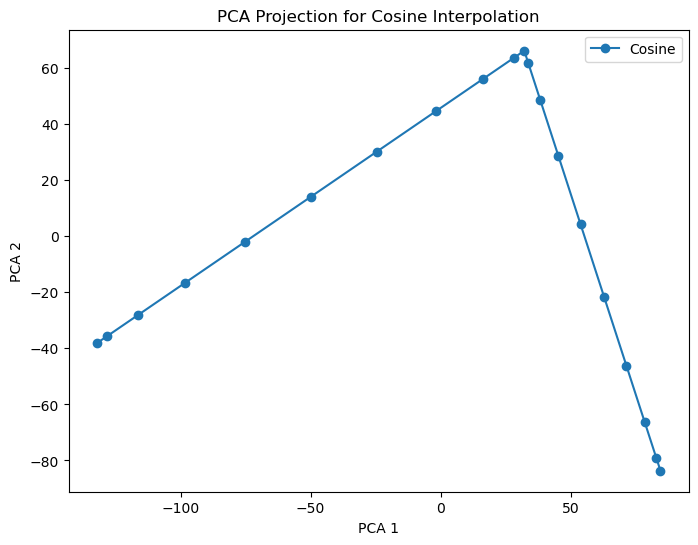

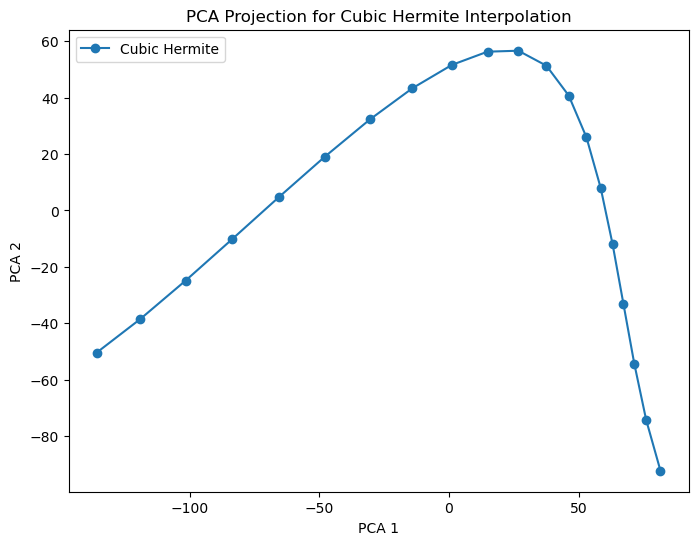

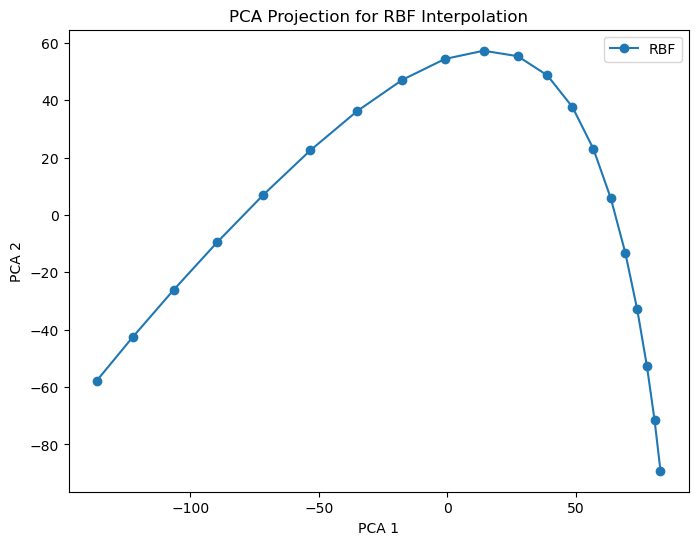

In [46]:
def plot_interpolation(strategy_name, interp_list):
    flat_samples = [sample.flatten() for sample in interp_list]
    X = np.vstack(flat_samples)
    pca = PCA(n_components=2)
    embedding = pca.fit_transform(X)
    plt.figure(figsize=(8,6))
    plt.plot(embedding[:, 0], embedding[:, 1], 'o-', label=strategy_name)
    plt.title(f"PCA Projection for {strategy_name} Interpolation")
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.legend()
    plt.show()

plot_interpolation("SLERP", slerp_interp)
plot_interpolation("Cosine", cosine_interp)
plot_interpolation("Cubic Hermite", cubic_interp)
plot_interpolation("RBF", rbf_interp)

This was the coolest part of the latent space exploration in my opinion. I knew the deep learning models would underperform, so I was excited to do pure exploration without any learning. The pathing between the different latents is so cool in my opinion. The algorithms interpolate before being reduced by PCA, so I was really shocked to see such nice curves on the 2D representation. This doesn't actually mean anything, but I waws super excited when I saw the different paths. I was sure this would mean different decoded images.

## 15. Visualizing Algorithmic Interpolations

Loaded latent shapes:
latent1 (4, 32, 32)
latent2 (4, 32, 32)
latent3 (4, 32, 32)


/tmp/ipykernel_2837551/433723038.py:9: DeprecationWarning:

__array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.



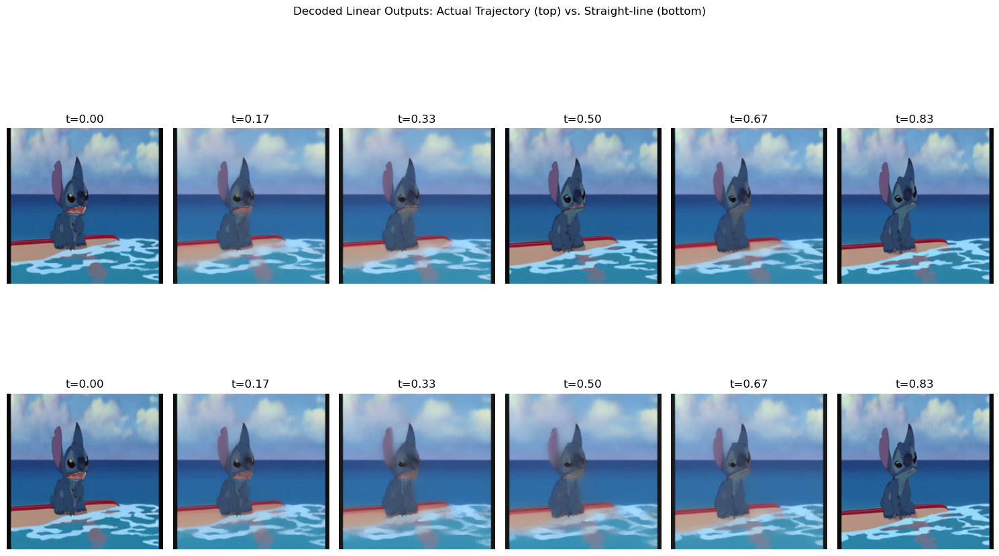

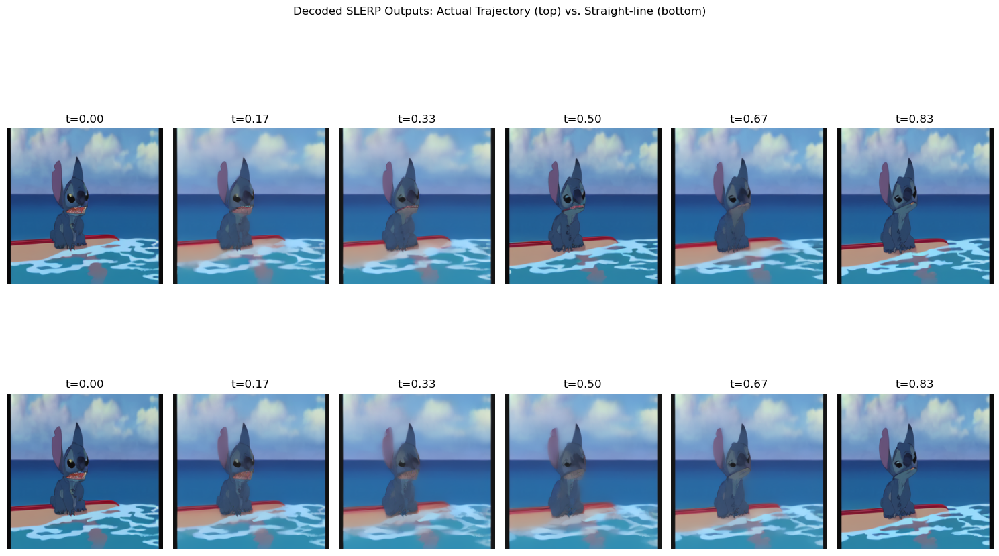

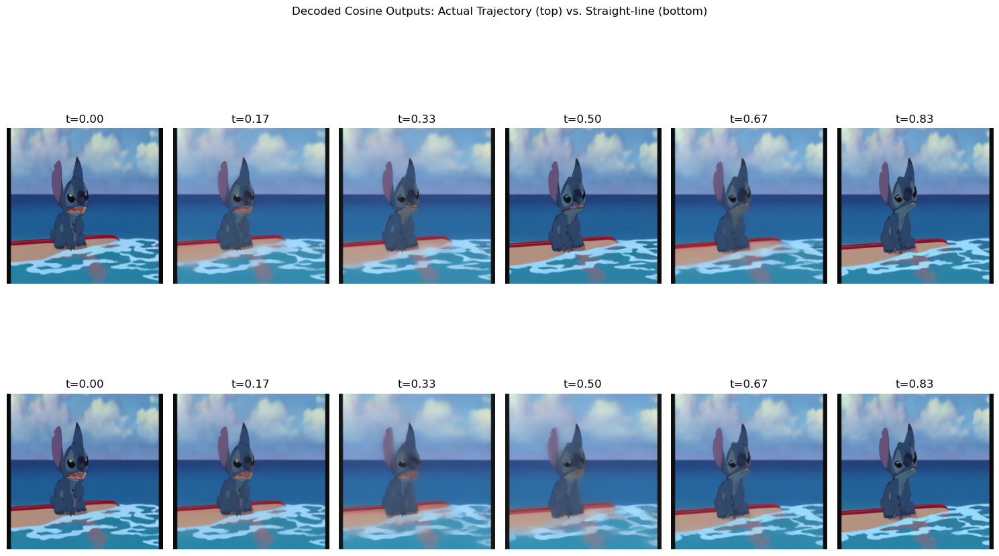

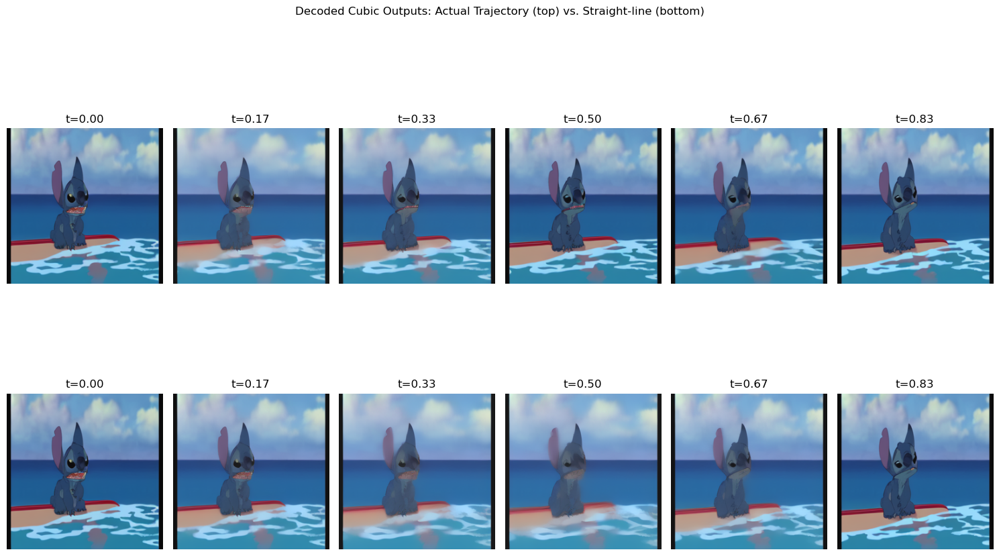

Loaded latent shapes:
latent1 (4, 32, 32)
latent2 (4, 32, 32)
latent3 (4, 32, 32)


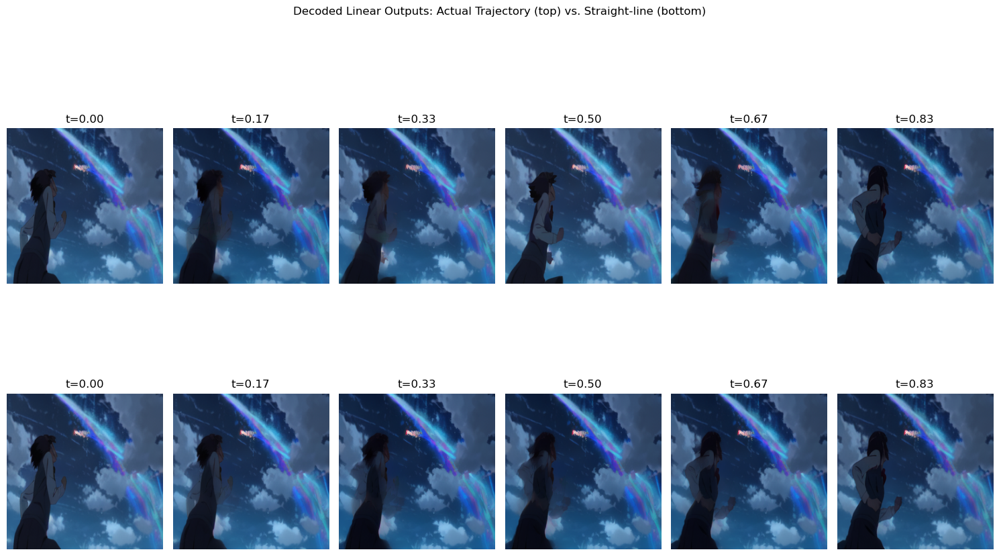

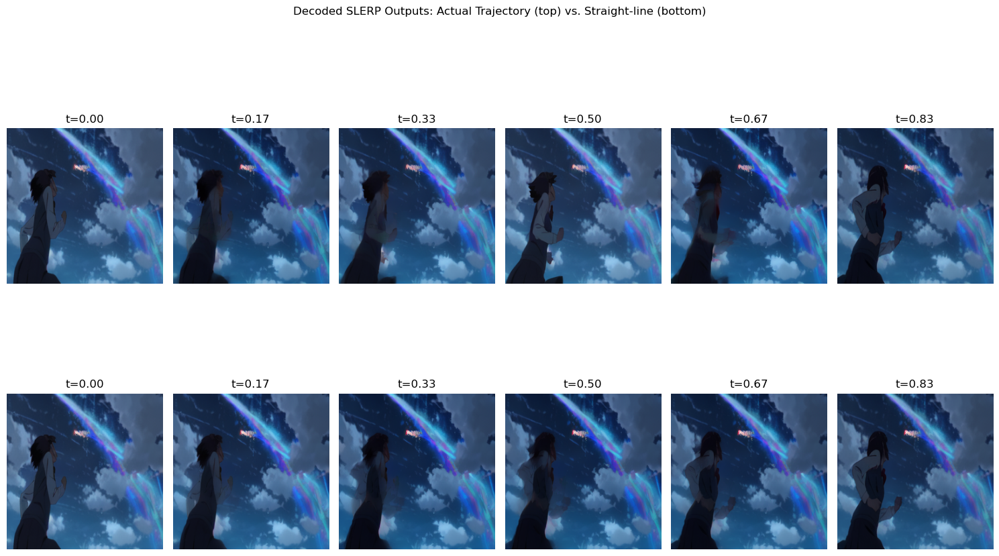

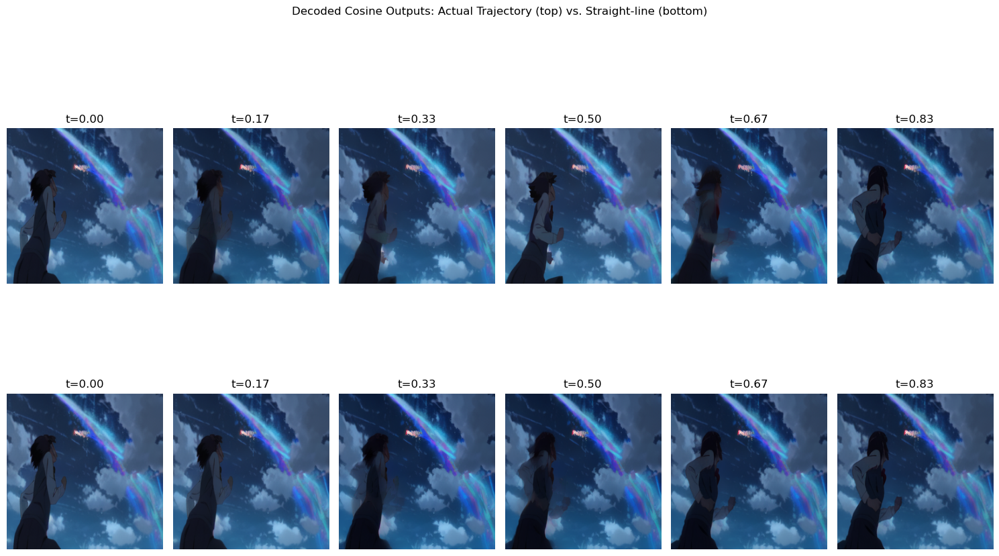

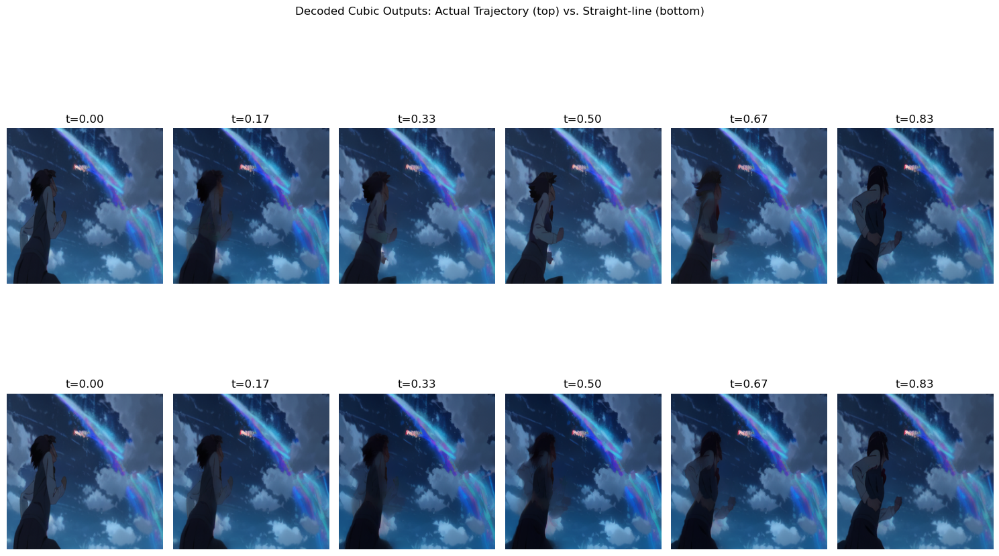

In [47]:
for sample_subdir in sample_both:
    latents = load_latents(sample_subdir)
    print("Loaded latent shapes:")
    for k, v in latents.items():
        print(k, v.shape)

    # Convert loaded latents to torch tensors (assuming float32)  
    latent1 = torch.tensor(latents["latent1"], dtype=torch.float32)
    latent2 = torch.tensor(latents["latent2"], dtype=torch.float32)
    latent3 = torch.tensor(latents["latent3"], dtype=torch.float32)

    # Define interpolation parameters
    num_steps_seg = 3  # steps per segment

    # Actual trajectory: latent1 -> latent2, then latent2 -> latent3
    actual_interpolations = []
    # Interpolate from latent1 to latent2
    for t in np.linspace(0, 1, num_steps_seg, endpoint=False):
        interp = linear_interpolation(latent1, latent2, t)
        actual_interpolations.append(interp)
    # Interpolate from latent2 to latent3
    for t in np.linspace(0, 1, num_steps_seg, endpoint=True):
        interp = linear_interpolation(latent2, latent3, t)
        actual_interpolations.append(interp)

    # Straight-line interpolation: latent1 -> latent3
    num_steps_total = 2 * num_steps_seg  # match total number of steps
    straight_interpolations = []
    for t in np.linspace(0, 1, num_steps_total, endpoint=True):
        interp = linear_interpolation(latent1, latent3, t)
        straight_interpolations.append(interp)



    # For each segment, we apply SLERP:
    num_steps = 3
    t_values = np.linspace(0, 1, num_steps, endpoint=False)
    slerp_interp = []
    # SLERP from latent1 to latent2:
    for t in t_values:
        slerp_interp.append(slerp(latent1.flatten(), latent2.flatten(), t).reshape(latent1.shape))
    # SLERP from latent2 to latent3 (including endpoint):
    t_values2 = np.linspace(0, 1, num_steps, endpoint=True)
    for t in t_values2:
        slerp_interp.append(slerp(latent2.flatten(), latent3.flatten(), t).reshape(latent1.shape))

    # Straight-line interpolation: latent1 -> latent3
    num_steps_total = 2 * num_steps_seg  # match total number of steps
    straight_slerp = []
    for t in np.linspace(0, 1, num_steps_total, endpoint=True):
        interp = slerp(latent1, latent3, t)
        straight_slerp.append(interp)



    num_steps = 3
    t_values = np.linspace(0, 1, num_steps, endpoint=False)
    cosine_interp = []
    # Cosine interpolation from latent1 to latent2:
    for t in t_values:
        cosine_interp.append(cosine_interpolation(latent1, latent2, t))
    # Cosine interpolation from latent2 to latent3:
    t_values2 = np.linspace(0, 1, num_steps, endpoint=True)
    for t in t_values2:
        cosine_interp.append(cosine_interpolation(latent2, latent3, t))

    # Straight-line interpolation: latent1 -> latent3
    num_steps_total = 2 * num_steps_seg  # match total number of steps
    straight_cosine = []
    for t in np.linspace(0, 1, num_steps_total, endpoint=True):
        interp = cosine_interpolation(latent1, latent3, t)
        straight_cosine.append(interp)



    # For piecewise interpolation, we need tangents.
    # A simple choice: for the segment from latent1 to latent2:
    m0_12 = latent2 - latent1
    # For the endpoint at latent2, we can set the tangent as the average of the incoming and outgoing differences.
    m1_12 = 0.5 * (latent3 - latent1)
    # Similarly, for segment latent2 to latent3:
    m0_23 = m1_12  # use the same tangent as latent2's
    m1_23 = latent3 - latent2
    num_steps = 3
    t_values = np.linspace(0, 1, num_steps, endpoint=False)
    cubic_interp = []
    # Cubic Hermite interpolation from latent1 to latent2:
    for t in t_values:
        interp = cubic_hermite(latent1, latent2, m0_12, m1_12, t)
        cubic_interp.append(interp)
    # Cubic Hermite interpolation from latent2 to latent3:
    t_values2 = np.linspace(0, 1, num_steps, endpoint=True)
    for t in t_values2:
        interp = cubic_hermite(latent2, latent3, m0_23, m1_23, t)
        cubic_interp.append(interp)

    # Straight-line interpolation: latent1 -> latent3
    num_steps_total = 2 * num_steps_seg  # match total number of steps
    straight_cubic = []
    for t in np.linspace(0, 1, num_steps_total, endpoint=True):
        interp = cubic_hermite(latent1, latent3, m0_12, (latent3-latent1), t)
        straight_cubic.append(interp)


    num_steps = 6
    t_values = np.linspace(0, 1, num_steps, endpoint=True)
    rbf_interp = []
    # Here we use all three points at once (latent1, latent2, latent3)
    for t in t_values:
        interp = rbf_interpolation(latent1, latent2, latent3, t)
        rbf_interp.append(interp)
    
    num_steps = 6
    t_values = np.linspace(0, 1, num_steps, endpoint=True)
    straight_rbf = []
    # Here we use all three points at once (latent1, latent2, latent3)
    for t in t_values:
        interp = rbf_interpolation(latent1, linear_interpolation(latent1, latent3, .5), latent3, t)
        straight_rbf.append(interp)


    with torch.no_grad():
        decoded_actual_linear = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in actual_interpolations]
        decoded_straight_linear = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in straight_interpolations]
        
        decoded_actual_slerp = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in slerp_interp]
        decoded_straight_slerp = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in straight_slerp]
        
        decoded_actual_cosine = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in cosine_interp]
        decoded_straight_cosine = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in straight_cosine]
        
        decoded_actual_cubic = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in cubic_interp]
        decoded_straight_cubic = [normalize_img(vae.decode(latent.unsqueeze(0).to(device)).sample.cpu()[0]) for latent in straight_cubic]
        
        # decoded_actual_rbf = [normalize_img(vae.decode(latent.to(device)).sample.cpu()[0]) for latent in rbf_interp]
        # decoded_straight_rbf = [normalize_img(vae.decode(latent.to(device)).sample.cpu()[0]) for latent in straight_rbf]

    # Plot the results: one row for actual trajectory and one row for straight-line interpolation.
    
    decoded_imgs = [
        ("Linear", decoded_actual_linear, decoded_straight_linear),
        ("SLERP", decoded_actual_slerp, decoded_straight_slerp),
        ("Cosine", decoded_actual_cosine, decoded_straight_cosine),
        ("Cubic", decoded_actual_cubic, decoded_straight_cubic),
        # ("RBF", decoded_actual_rbf, decoded_straight_rbf)
    ]
    for name, decoded_actual, decoded_straight in decoded_imgs:
        num_samples = len(decoded_actual_linear)
        plt.figure(figsize=(15, 10))
        for i in range(num_samples):
            # Actual trajectory row (top)
            plt.subplot(2, num_samples, i+1)
            img = decoded_actual[i].permute(1,2,0).numpy()
            plt.imshow(img)
            plt.title(f"t={i/num_samples:.2f}")
            plt.axis("off")
            # Straight-line row (bottom)
            plt.subplot(2, num_samples, num_samples + i+1)
            img2 = decoded_straight[i].permute(1,2,0).numpy()
            plt.imshow(img2)
            plt.title(f"t={i/num_samples:.2f}")
            plt.axis("off")
        plt.suptitle(f"Decoded {name} Outputs: Actual Trajectory (top) vs. Straight-line (bottom)")
        plt.tight_layout()
        plt.show()

Unfortunately, they're all pretty much the same. This is pretty obvious if you take a step back and realizae that the curved vs straight paths all live in pretty much the same exact spot in the latent space. We see the same blurring strategy that we saw in the linear interpolation. This is underwhelming, but it makes sense.

## Conclusion

Overall, I'm pretty happy with the progress I made on this project. This is my third time revisiting this dataset, but this was probably my favorite. I've been super interested in latent spaces this quarter, and this was the perfect analysis of latent spaces for me. The dataset is a familiar territory, but the methods are mostly new. I'm very pleased with the pipeline that is now set up for me to train whatever deep learning models I want on this dataset. Also, since the VAE worked so well, I can train my next model in the latent space. This is very exciting to me. I tried finetuning the VAE on this dataset, and the KL do trend downward (see ```vae/vae_loss.png``` for a screenshot of the finetuning), but the decoded images all look the same. They are just a little bit of brown blurred throughout a black background. My guess is that it learned to average all of the images. For this project, a large amount of my time was spent finetuning the VAE and training the deep learning models. This is unfortunate because those were the 2 parts of the project that yielded the least results. I'm very happy with the latent space analysis, so that definitely makes up for the shortcomings of the other 2 parts.